# Deep and Reinforcement Learning 2024/2025 (M.IA003), FEUP/FCUP

## Deep Learning Project 
## **Develop Deep Learning Discriminative and Generative Models, applied to the context of deep fakes**

work done by:
- Michal Kowalski up202401554
- Pedro Pereira up201708807
- Pedro Azevedo up201905966

# **PART 1: CLASSIFICATOR of REAL/FAKE FACES**

# 1.1 Import Necessary Files

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
import matplotlib.pyplot as plt
import os
import tensorflow as tf
#import glob
#from _model import *
#from tensorflow.keras.models import load_model
#import json
from _preprocess import *
from _eda import *
#from _augmentation import *
# tf.keras.mixed_precision.set_global_policy('mixed_float16')

2025-04-07 23:03:38.280168: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Define dataset directories
data_dir = "data"
real_dir = os.path.join(data_dir, "real")
fake1_dir = os.path.join(data_dir, "fake1")
fake2_dir = os.path.join(data_dir, "fake2")
fake3_dir = os.path.join(data_dir, "fake3")

# 1.2 Basic EDA
In this step, EDA (Exploratory Data Analysis) is used to examine the image extensions, sizes, and types, helping to identify inconsistencies and enabling further standardization for the model training process.

In [15]:
# Datasets basic EDA
base_stats(real_dir, 'Real')
base_stats(fake1_dir, 'Fake1')
base_stats(fake2_dir, 'Fake2')
base_stats(fake3_dir, 'Fake3')

Skipping .DS_Store: cannot identify image file '/Users/me/Desktop/new/project/Discriminative-Generative-Models-ACPR-/data/real/.DS_Store'

Real Images Summary:
Total images: 30000
Formats: Counter({'JPEG': 28952, 'PNG': 1005, 'GIF': 36, 'MPO': 7})
Color Modes: Counter({'RGB': 26445, 'L': 2840, 'RGBA': 664, 'P': 40, 'LA': 11})
Top 5 Sizes: [((440, 660), 1469), ((440, 587), 959), ((440, 293), 688), ((440, 330), 579), ((440, 440), 272)]

Fake1 Images Summary:
Total images: 30000
Formats: Counter({'JPEG': 30000})
Color Modes: Counter({'RGB': 30000})
Top 5 Sizes: [((512, 512), 30000)]

Fake2 Images Summary:
Total images: 30000
Formats: Counter({'JPEG': 30000})
Color Modes: Counter({'RGB': 30000})
Top 5 Sizes: [((512, 512), 30000)]

Fake3 Images Summary:
Total images: 30000
Formats: Counter({'JPEG': 30000})
Color Modes: Counter({'RGB': 30000})
Top 5 Sizes: [((512, 512), 30000)]


As we can see, only Real Images set is non-standardized.

## 1.3 Images Standardization

The next step is to standardize the images by resizing them to consistent dimensions, converting them to a uniform type, and ensuring all images have the same file extensions. This ensures uniformity across the dataset.

- **Real Images**: 30,000 images (+15,000 augmented in later steps)
- **Fake Images**:
  - 15,000 Fake Stable Diffusion v1.5
  - 15,000 Fake Stable Diffusion Inpainting
  - 15,000 Fake InsightFace


In [17]:
# Drop images to reduce data size and keep 30000 (+15000 augumented) reals and 45000 fakes to keep the balance
source_dir1 = "data/fake1/"
source_dir2 = "data/fake2/"
source_dir3 = "data/fake3/"
select_and_remove_images(source_dir1, num_images_to_keep=15000)
select_and_remove_images(source_dir2, num_images_to_keep=15000)
select_and_remove_images(source_dir3, num_images_to_keep=15000)

Removed 15000 images.
Removed 15000 images.
Removed 15000 images.


In [ ]:
# Standardize images 
standardize_files('data/real', (224,224))
standardize_files('data/fake1', (224,224))
standardize_files('data/fake2', (224,224))
standardize_files('data/fake3', (224,224))

In [5]:
# Define normalized dataset directories
real_dir = os.path.join(data_dir, "real_normalized")
fake1_dir = os.path.join(data_dir, "fake1_normalized")
fake2_dir = os.path.join(data_dir, "fake2_normalized")
fake3_dir = os.path.join(data_dir, "fake3_normalized")
# Datasets basic EDA after normalization
base_stats(real_dir, 'Real')
base_stats(fake1_dir, 'Fake1')
base_stats(fake2_dir, 'Fake2')
base_stats(fake3_dir, 'Fake3')


Real Images Summary:
Total images: 30000
Formats: Counter({'JPEG': 30000})
Color Modes: Counter({'RGB': 30000})
Top 5 Sizes: [((224, 224), 30000)]

Fake1 Images Summary:
Total images: 15000
Formats: Counter({'JPEG': 15000})
Color Modes: Counter({'RGB': 15000})
Top 5 Sizes: [((224, 224), 15000)]

Fake2 Images Summary:
Total images: 15000
Formats: Counter({'JPEG': 15000})
Color Modes: Counter({'RGB': 15000})
Top 5 Sizes: [((224, 224), 15000)]

Fake3 Images Summary:
Total images: 15000
Formats: Counter({'JPEG': 15000})
Color Modes: Counter({'RGB': 15000})
Top 5 Sizes: [((224, 224), 15000)]


# 1.4 Train, Validation, Test Split

## 1.4.1 Real and Fake Sets Split

The datasets are split as follows:

- **Real Dataset (30,000 images)**:
  - Training: 70% (16,500 images)
  - Validation: 22.5% (6,570 images)
  - Test: 22.5% (6,750 images)
  
  *Note: The training set will be further balanced through real image augmentation.*

- **Fake Dataset (45,000 images)**:
  - Training: 70% (31,500 images)
  - Validation: 15% (6,570 images)
  - Test: 15% (6,750 images)

In [30]:
# Get list of paths for train/val/test sets
real_dirs = ['data/real_normalized']
fake_dirs = ['data/fake1_normalized', 'data/fake2_normalized', 'data/fake3_normalized']
# 70/30/30
real_train, real_val, real_test, fake_train, fake_val, fake_test = create_train_val_test_split(real_dirs, fake_dirs, test_val_size_real=0.15, test_val_size_fake=0.15)

Real Train:  21000
Real Val:  4500
Real Test:  4500
Fake Train:  21000
Fake Val:  4500
Fake Test:  4500


In [ ]:
# Move train/val/test sets to a proper dictionaries structure
output_dir = 'data/split'
copy_split_data(real_train, real_val, real_test, fake_train, fake_val, fake_test, output_dir)

## 1.4.2 Real Images Augmentation

### Image Augmentation for Class Balance

In this step, image augmentation is applied to the "real" images in order to ensure class balance within the training dataset:

1. **Horizontal Flip and Hue Adjustment**: 
   The `flip_hue_augmentation` function is used to flip the images horizontally and adjust their hue, introducing color variations that simulate different lighting conditions.

2. **Brightness and Hue Adjustment**:
   The `brightness_hue_augmentation` function modifies the brightness and hue of the images, helping the model to become more robust to varying lighting conditions.

3. **Zoom Augmentation**: 
   The `zoom_augmentation` function applies zoom and cropping transformations, simulating different zoom levels in the images.

These augmentations contribute to increasing the diversity of the dataset, improving the model's ability to generalize to new and unseen data.


In [15]:
# Real Images Augmentation to keep the classes balance
input_folder = 'data/split/train/real'
output_folder = 'data/split/train/real'

# Get the list of filenames (images)
filenames = os.listdir(input_folder)

# Perform augmentations
# 5000 images after adjusting brightness and hue
brightness_hue_augmentation(input_folder, output_folder, filenames, num_augmented_images=5000)
# 5000 images after horizontal flip and hue change
flip_hue_augmentation(input_folder, output_folder, filenames, num_augmented_images=5000)
# 5000 images after zooming
zoom_augmentation(input_folder, output_folder, filenames, num_augmented_images=5000, zoom_factor=0.3)

Brightness and hue adjustment complete, 5000 images saved.
Horizontal flip and hue adjustment complete, 5000 images saved.
Zoom augmentation complete, 5000 images saved.


# 1.5 Modeling

## 1.4 Modeling with TensorFlow Keras

In this step, we use TensorFlow Keras to create and train Convolutional Neural Networks (CNNs) for the classification task. TensorFlow Keras provides a high-level interface for defining models, training them, and evaluating their performance.

- **Final Data Preprocessing**: Before training, the images are normalized [0,1], and in some models data augmentation techniques are applied to increase the variety in the dataset. Moreover, more advanced images preprocessing algorithms were used in the further steps.
- **Model Creation**: We define CNN architectures using Keras layers such as `Conv2D`, `MaxPooling2D`, `BatchNormalization`, `Dense`, and `Dropout` to build a deep learning model for image classification.
- **Training**: The model is trained on the standardized dataset, with proper use of training-validation-test splits and optimization techniques such as Learning Rate Decay, L2 regularization, and dropout.
- **Evaluation**: The trained model is evaluated using metrics like accuracy, precision, and recall to assess its performance on unseen data.

These metrics help us understand how well the model is performing at classifying images, distinguishing between real and fake images, and detecting specific patterns.


## - 1st CNN MODEL:

### Dataset
- **Training set**: 63,000 images 200x200
- **Validation set**: 13,500 images 200x200
- **Test set**: 13,500 images 200x200
- **Batch size**: 64

### Model Architecture
The model consists of:
- **2 Conv2D layers** with ReLU activation, followed by **BatchNormalization** and **MaxPooling2D** layers.
- **1 Dense layers** with ReLU activation, and a **Dropout layer** with a 50% rate for regularization.
- The final **Output layer** uses a sigmoid activation for binary classification.

### Model Compilation
The model is compiled using:
- **Optimizer**: Adam
- **Loss Function**: Binary Crossentropy
- **Metrics**: Accuracy, Precision, and Recall

### Training Configuration
The model is trained for **10 epochs**, with accuracy, precision, and recall monitored to evaluate the model's performance.



In [39]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

# Paths to train/val/test datasets
train_dir = 'data/split/train'
val_dir = 'data/split/val'
test_dir = 'data/split/test'

In [5]:
# Normalize pixels values to [0,1]
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load datasets, split into batches (batch size 64) and resize 200x200
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(200, 200),
    batch_size=64,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(200, 200),
    batch_size=64,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(200, 200),
    batch_size=64,
    class_mode='binary'
)

Found 62999 images belonging to 2 classes.
Found 13500 images belonging to 2 classes.
Found 13500 images belonging to 2 classes.


In [ ]:
# the 1st CNN model
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])
# Model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_94 (Conv2D)          (None, 198, 198, 32)      896       
                                                                 
 batch_normalization_94 (Ba  (None, 198, 198, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 99, 99, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_95 (Conv2D)          (None, 97, 97, 64)        18496     
                                                                 
 batch_normalization_95 (Ba  (None, 97, 97, 64)        256       
 tchNormalization)                                               
                                                        

In [8]:
# Compile the model
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', 'Precision', 'Recall']
)

In [9]:
# Train the model with 10 epochs
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
)

Epoch 1/10
984/984 [==============================] - 527s 535ms/step - loss: 1.0592 - accuracy: 0.5784 - precision: 0.6796 - recall: 0.2968 - val_loss: 17.5393 - val_accuracy: 0.5481 - val_precision: 0.9231 - val_recall: 0.1053
Epoch 2/10
984/984 [==============================] - 517s 526ms/step - loss: 0.4526 - accuracy: 0.7129 - precision: 0.7205 - recall: 0.6954 - val_loss: 0.2283 - val_accuracy: 0.9641 - val_precision: 0.9784 - val_recall: 0.9492
Epoch 3/10
984/984 [==============================] - 532s 540ms/step - loss: 0.3783 - accuracy: 0.7418 - precision: 0.7316 - recall: 0.7640 - val_loss: 1.0412 - val_accuracy: 0.8943 - val_precision: 0.8309 - val_recall: 0.9900
Epoch 4/10
984/984 [==============================] - 538s 546ms/step - loss: 0.3613 - accuracy: 0.7463 - precision: 0.6722 - recall: 0.9615 - val_loss: 0.0951 - val_accuracy: 0.9848 - val_precision: 0.9915 - val_recall: 0.9780
Epoch 5/10
984/984 [==============================] - 535s 544ms/step - loss: 0.3678 - 

In [ ]:
# Display model history function
def plot_model_history(history):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

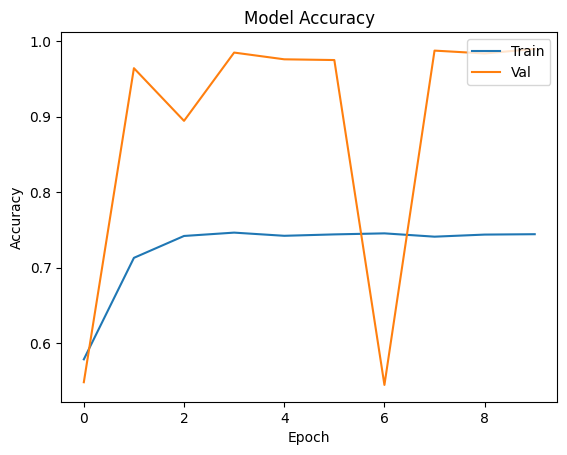

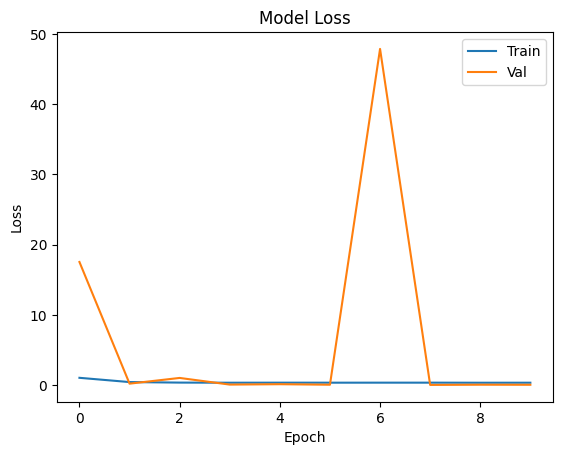

In [15]:
# Display Model Performance during the training
plot_model_history(history)

In [19]:
# Evaluate model using test set
test_loss, test_acc, test_precision, test_recall = model.evaluate(test_generator)

print('Accuracy:', test_acc)
print('Loss:', test_loss)
print('Precision:', test_precision)
print('Recall:', test_recall)

211/211 [==============================] - 32s 149ms/step - loss: 0.0638 - accuracy: 0.9891 - precision: 0.9862 - recall: 0.9921
Accuracy: 0.9891111254692078
Loss: 0.06375036388635635
Precision: 0.9861581325531006
Recall: 0.9921481609344482


## - 2nd CNN MODEL:

- Improvements: enhanced images size, random train data augmentation during the training, additional Dropout layer after CNN layers

### Datasets:
- **Training set**: 63,000 images 224x224 + Data Augmentation
- **Validation set**: 13,500 images 224x224
- **Test set**: 13,500 images 224x224
- **Batch size**: 64

### Model Architecture
The model consists of:
- **2 Conv2D layers** with ReLU activation, followed by **BatchNormalization** and **MaxPooling2D** layers.
- **Dropout layer** with a 25% rate after CNN layers.
- **1 Dense layers** with ReLU activation, and a **Dropout layer** with a 50% rate for regularization.
- The final **Output layer** uses a sigmoid activation.
### Model Compilation
The model is compiled using:
- **Optimizer**: Adam
- **Loss Function**: Binary Crossentropy
- **Metrics**: Accuracy, Precision, and Recall

### Training Configuration
The model is trained for **10 epochs**, with accuracy, precision, and recall monitored to evaluate the model's performance.


In [7]:
# Normalize pixels values to [0,1] and use augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,                  
    shear_range=0.2,          
    zoom_range=0.2,          
    horizontal_flip=True,   
    fill_mode='nearest' 
)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Load datasets, split into batches (batch size 64) and resize 224x224
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary'
)

Found 62999 images belonging to 2 classes.
Found 13500 images belonging to 2 classes.
Found 13500 images belonging to 2 classes.


In [ ]:
# the 2nd CNN model
model2 = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])
# Model summary
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 batch_normalization_96 (Ba  (None, 222, 222, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_97 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 batch_normalization_97 (Ba  (None, 109, 109, 64)      256       
 tchNormalization)                                               
                                                      

In [26]:
# Compile the model
model2.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', 'Precision', 'Recall']
)

In [27]:
# Model training with 10 epochs
history2 = model2.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
)

Epoch 1/10
492/492 [==============================] - 695s 1s/step - loss: 1.1275 - accuracy: 0.5396 - precision: 0.5351 - recall: 0.6028 - val_loss: 47.0641 - val_accuracy: 0.5084 - val_precision: 0.5044 - val_recall: 0.9619
Epoch 2/10
492/492 [==============================] - 696s 1s/step - loss: 0.6854 - accuracy: 0.5790 - precision: 0.6091 - recall: 0.4405 - val_loss: 0.6649 - val_accuracy: 0.5852 - val_precision: 0.6403 - val_recall: 0.3896
Epoch 3/10
492/492 [==============================] - 701s 1s/step - loss: 0.6627 - accuracy: 0.5885 - precision: 0.6878 - recall: 0.3240 - val_loss: 0.6535 - val_accuracy: 0.6343 - val_precision: 0.6179 - val_recall: 0.7026
Epoch 4/10
492/492 [==============================] - 707s 1s/step - loss: 0.6379 - accuracy: 0.6056 - precision: 0.7185 - recall: 0.3472 - val_loss: 0.6101 - val_accuracy: 0.6645 - val_precision: 0.6854 - val_recall: 0.6077
Epoch 5/10
492/492 [==============================] - 694s 1s/step - loss: 0.6265 - accuracy: 0.618

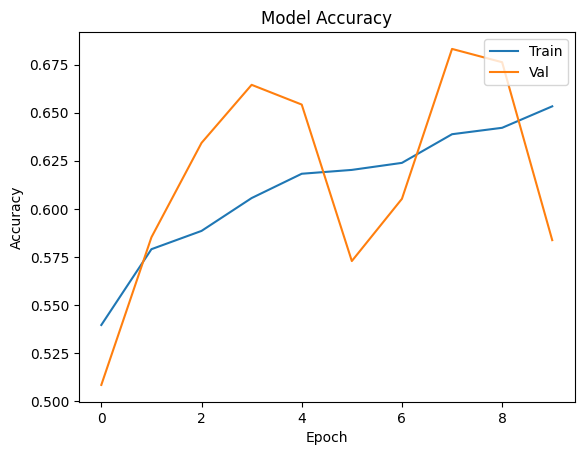

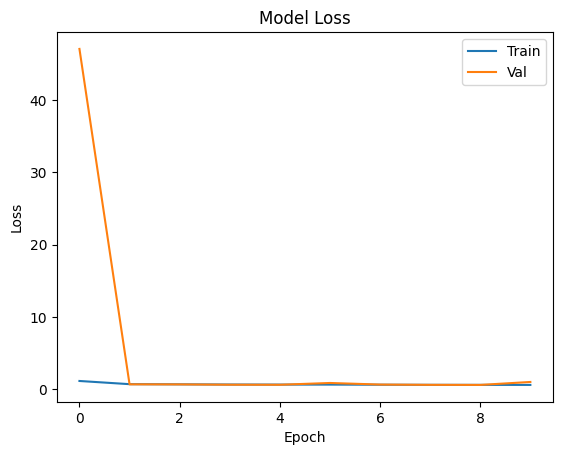

In [28]:
# Display Model Performance during the training
plot_model_history(history2)

In [29]:
test_loss, test_acc, test_precision, test_recall = model2.evaluate(test_generator)

print('Accuracy:', test_acc)
print('Loss:', test_loss)
print('Precision:', test_precision)
print('Recall:', test_recall)

106/106 [==============================] - 35s 332ms/step - loss: 0.9768 - accuracy: 0.5893 - precision: 0.5497 - recall: 0.9868
Accuracy: 0.5892592668533325
Loss: 0.9768104553222656
Precision: 0.5497235059738159
Recall: 0.9868147969245911


## - 3rd CNN MODEL:

- Improvements: enhanced batch size to 128, additional CNN and Dense Layer, Learning Rate Decay

### Datasets:
- **Training set**: 63,000 images 224x224 + Data Augmentation
- **Validation set**: 13,500 images 224x224
- **Test set**: 13,500 images 224x224
- **Batch size**: 128

### Model Architecture
The model consists of:
- **3 Conv2D layers** with ReLU activation, followed by **BatchNormalization** and **MaxPooling2D** layers.
- **Dropout layer** with a 25% rate after CNN layers.
- **2 Dense layers** with ReLU activation, and a **Dropout layer** with a 30% rate for regularization.
- The final **Output layer** uses a sigmoid activation.
### Model Compilation
The model is compiled using:
- **Optimizer**: Adam + Learning Rate Decay
- **Loss Function**: Binary Crossentropy
- **Metrics**: Accuracy, Precision, and Recall

### Training Configuration
The model is trained for **10 epochs**, with accuracy, precision, and recall monitored to evaluate the model's performance.


In [ ]:
# Normalize pixels values to [0,1] and use augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [8]:
# Load datasets, split into batches (batch size 128) and resize 224x224
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=128,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=128,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=128,
    class_mode='binary'
)

Found 62999 images belonging to 2 classes.
Found 13500 images belonging to 2 classes.
Found 13500 images belonging to 2 classes.


In [22]:
# 3rd CNN Model
model3 = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

model3.summary(print_fn=print)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_112 (Conv2D)         (None, 222, 222, 32)      896       
                                                                 
 batch_normalization_112 (B  (None, 222, 222, 32)      128       
 atchNormalization)                                              
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_113 (Conv2D)         (None, 109, 109, 64)      18496     
                                                                 
 batch_normalization_113 (B  (None, 109, 109, 64)      256       
 atchNormalization)                                              
                                                      

In [23]:
from tensorflow.keras.optimizers.legacy import Adam
# Learning Rate Delay
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=train_generator.samples // train_generator.batch_size,
    decay_rate=0.95
)
optimizer = Adam(learning_rate=lr_schedule)
# Compile the model
model3.compile(
    optimizer=optimizer,
    loss='binary_crossentropy',
    metrics=['accuracy', 'Precision', 'Recall']
)

In [ ]:
# Train the model with 10 epochs
history3 = model3.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=10,
        validation_data=val_generator,
        validation_steps=val_generator.samples // val_generator.batch_size,
)

Epoch 1/10
492/492 [==============================] - 896s 2s/step - loss: 0.8022 - accuracy: 0.6203 - precision: 0.6093 - recall: 0.6713 - val_loss: 0.7334 - val_accuracy: 0.5648 - val_precision: 0.5412 - val_recall: 0.8484
Epoch 2/10
492/492 [==============================] - 893s 2s/step - loss: 0.5822 - accuracy: 0.6746 - precision: 0.6629 - recall: 0.7102 - val_loss: 0.6363 - val_accuracy: 0.6461 - val_precision: 0.6039 - val_recall: 0.8468
Epoch 3/10
492/492 [==============================] - 889s 2s/step - loss: 0.5569 - accuracy: 0.6985 - precision: 0.7058 - recall: 0.6809 - val_loss: 0.8057 - val_accuracy: 0.6159 - val_precision: 0.5685 - val_recall: 0.9649
Epoch 4/10
492/492 [==============================] - 886s 2s/step - loss: 0.5360 - accuracy: 0.7146 - precision: 0.7218 - recall: 0.6982 - val_loss: 0.8335 - val_accuracy: 0.5627 - val_precision: 0.5341 - val_recall: 0.9757
Epoch 5/10
492/492 [==============================] - 886s 2s/step - loss: 0.5143 - accuracy: 0.7308

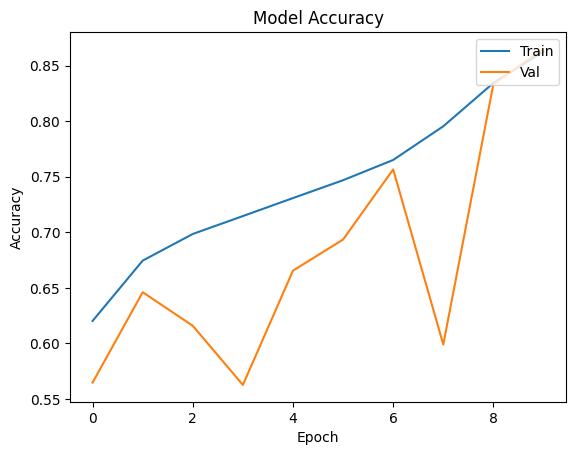

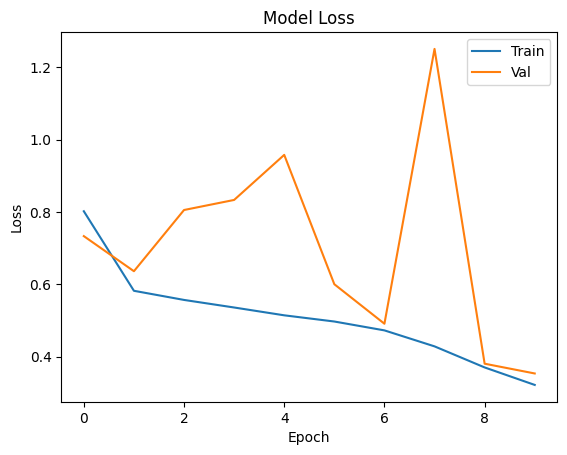

In [25]:
# Display Model Performance during the training
plot_model_history(history3)

In [9]:
test_loss, test_acc, test_precision, test_recall = model3.evaluate(test_generator)

print('Accuracy:', test_acc)
print('Loss:', test_loss)
print('Precision:', test_precision)
print('Recall:', test_recall)

106/106 [==============================] - 49s 458ms/step - loss: 0.3545 - accuracy: 0.8634 - precision: 0.9203 - recall: 0.7957
Accuracy: 0.8634074330329895
Loss: 0.3544915020465851
Precision: 0.9203221201896667
Recall: 0.7957037091255188


## - 4th CNN MODEL:

- Improvements: used YOLOv8 to cropp faces (30000 real and 30000 fake images)

### Datasets:
- **Training set**: 30858 images 200x200 + Data Augmentation
- **Validation set**: 6612 images 200x200
- **Test set**: 6613 images 200x200
- **Batch size**: 128

### Model Architecture
The model consists of:
- **3 Conv2D layers** with ReLU activation, followed by **BatchNormalization** and **MaxPooling2D** layers.
- **Dropout layer** with a 20% rate after CNN layers.
- **2 Dense layers** with ReLU activation, and a **Dropout layer** with a 40% rate for regularization.
- The final **Output layer** uses a sigmoid activation.
### Model Compilation
The model is compiled using:
- **Optimizer**: Adam + Learning Rate Decay
- **Loss Function**: Binary Crossentropy
- **Metrics**: Accuracy, Precision, and Recall

### Training Configuration
The model is trained for **10 epochs**, with accuracy, precision, and recall monitored to evaluate the model's performance.


In [43]:
# Drop images to reduce data size to keep 30000 real and 30000 fakes for Crop Image
source_dir1 = "data/fake1_normalized/"
source_dir2 = "data/fake2_normalized/"
source_dir3 = "data/fake3_normalized/"
select_and_remove_images(source_dir1, num_images_to_keep=10000)
select_and_remove_images(source_dir2, num_images_to_keep=10000)
select_and_remove_images(source_dir3, num_images_to_keep=10000)

In [60]:
# Crop Images with faces for real
input_directory = "data/real_normalized/"
output_directory = "data/cropped_real/"

target_size = (200, 200)  # Target size for the cropped faces

detect_and_crop_faces(input_root=input_directory, output_folder=output_directory, target_size=target_size)


0: 640x448 1 face, 48.8ms
Speed: 1.6ms preprocess, 48.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 448)

0: 448x640 1 face, 51.6ms
Speed: 1.2ms preprocess, 51.6ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x480 3 faces, 57.5ms
Speed: 1.2ms preprocess, 57.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)

0: 640x448 1 face, 40.5ms
Speed: 1.0ms preprocess, 40.5ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 448)

0: 640x448 1 face, 64.5ms
Speed: 1.2ms preprocess, 64.5ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 448)

0: 640x640 11 faces, 55.3ms
Speed: 1.2ms preprocess, 55.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x448 1 face, 36.4ms
Speed: 1.0ms preprocess, 36.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 448)

0: 640x480 1 face, 42.4ms
Speed: 1.2ms preprocess, 42.4ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 480)

0: 6

In [61]:
# Crop Images with faces for fake1
input_directory = "data/fake1_normalized/"
output_directory = "data/cropped_fake/"

detect_and_crop_faces(input_root=input_directory, output_folder=output_directory, target_size=target_size)


0: 640x640 1 face, 70.3ms
Speed: 1.9ms preprocess, 70.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 86.5ms
Speed: 1.2ms preprocess, 86.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 63.9ms
Speed: 1.6ms preprocess, 63.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 59.3ms
Speed: 1.2ms preprocess, 59.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 66.5ms
Speed: 1.2ms preprocess, 66.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 57.4ms
Speed: 1.2ms preprocess, 57.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 faces, 48.0ms
Speed: 1.4ms preprocess, 48.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 51.3ms
Speed: 1.2ms preprocess, 51.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640

In [62]:
# Crop Images with faces for fake2
input_directory = "data/fake2_normalized/"
output_directory = "data/cropped_fake/"

detect_and_crop_faces(input_root=input_directory, output_folder=output_directory, target_size=target_size)


0: 640x640 1 face, 62.7ms
Speed: 1.9ms preprocess, 62.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 58.6ms
Speed: 1.6ms preprocess, 58.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 faces, 65.6ms
Speed: 1.3ms preprocess, 65.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 80.1ms
Speed: 1.3ms preprocess, 80.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 10 faces, 58.1ms
Speed: 1.1ms preprocess, 58.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 55.7ms
Speed: 1.4ms preprocess, 55.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 5 faces, 57.5ms
Speed: 1.2ms preprocess, 57.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 faces, 46.7ms
Speed: 1.7ms preprocess, 46.7ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 640)

0:

In [63]:
# Crop Images with faces for fake3
input_directory = "data/fake3_normalized/"
output_directory = "data/cropped_fake/"

detect_and_crop_faces(input_root=input_directory, output_folder=output_directory, target_size=target_size)


0: 640x640 1 face, 62.1ms
Speed: 1.7ms preprocess, 62.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 faces, 78.0ms
Speed: 2.1ms preprocess, 78.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 68.0ms
Speed: 1.2ms preprocess, 68.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 55.9ms
Speed: 2.2ms preprocess, 55.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 58.6ms
Speed: 1.3ms preprocess, 58.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 56.3ms
Speed: 1.2ms preprocess, 56.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 56.3ms
Speed: 1.3ms preprocess, 56.3ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 face, 51.5ms
Speed: 1.1ms preprocess, 51.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640

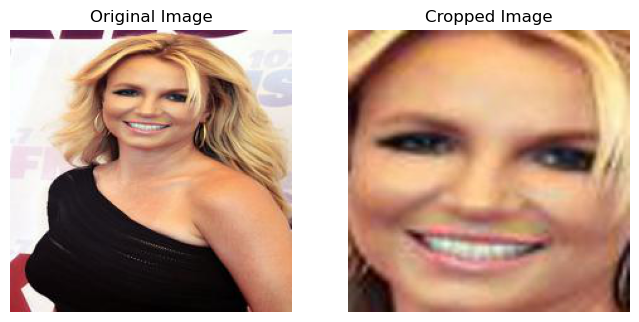

In [96]:
# Results
input_img = Image.open("data/test/britney.jpg")
cropped_img = Image.open("data/cropped_test/britney_c.jpg")

fig, axes = plt.subplots(1, 2, figsize=(8, 5))
axes[0].imshow(input_img)
axes[0].axis('off')
axes[1].imshow(cropped_img)
axes[1].axis('off')
axes[0].set_title("Original Image")
axes[1].set_title("Cropped Image")
plt.show()

In [68]:
# Split Datasets into train/val/test
real_dirs = ['data/cropped_real']
fake_dirs = ['data/cropped_fake']

real_train, real_val, real_test, fake_train, fake_val, fake_test = create_train_val_test_split(real_dirs, fake_dirs, test_val_size_real=0.15, test_val_size_fake=0.15)
output_dir = 'data/split_cropped'
copy_split_data(real_train, real_val, real_test, fake_train, fake_val, fake_test, output_dir)

Real Train:  16921
Real Val:  3626
Real Test:  3626
Fake Train:  13937
Fake Val:  2986
Fake Test:  2987


In [71]:
output_dir = 'data/split_cropped'
# Call the function to copy train, val, test sets into the correct dictionaries
copy_split_data(real_train, real_val, real_test, fake_train, fake_val, fake_test, output_dir)

In [81]:
# Paths to datasets
train_dir = 'data/split_cropped/train'
val_dir = 'data/split_cropped/val'
test_dir = 'data/split_cropped/test'

# Normalize pixels values to [0,1] and use augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [82]:
# Load datasets, split into batches (batch size 128) and resize 200x200
train_generator_c = train_datagen.flow_from_directory(
    train_dir,
    target_size=(200, 200),
    batch_size=128,
    class_mode='binary'
)

val_generator_c = val_datagen.flow_from_directory(
    val_dir,
    target_size=(200, 200),
    batch_size=128,
    class_mode='binary'
)

test_generator_c = test_datagen.flow_from_directory(
    test_dir,
    target_size=(200, 200),
    batch_size=128,
    class_mode='binary'
)

Found 30858 images belonging to 2 classes.
Found 6612 images belonging to 2 classes.
Found 6613 images belonging to 2 classes.


In [84]:
# the 4th CNN Model
model4 = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])
model4.summary(print_fn=print)

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_124 (Conv2D)         (None, 198, 198, 32)      896       
                                                                 
 batch_normalization_124 (B  (None, 198, 198, 32)      128       
 atchNormalization)                                              
                                                                 
 max_pooling2d_34 (MaxPooli  (None, 99, 99, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_125 (Conv2D)         (None, 97, 97, 64)        18496     
                                                                 
 batch_normalization_125 (B  (None, 97, 97, 64)        256       
 atchNormalization)                                              
                                                     

In [ ]:
optimizer = Adam(learning_rate=lr_schedule)

# Compile the model
model4.compile(
    optimizer=optimizer,
    loss='binary_crossentropy',
    metrics=['accuracy', 'Precision', 'Recall']
)

In [85]:
history4 = model4.fit(
        train_generator_c,
        steps_per_epoch=train_generator_c.samples // train_generator_c.batch_size,
        epochs=10,
        validation_data=val_generator_c,
        validation_steps=val_generator_c.samples // val_generator_c.batch_size,
)

Epoch 1/10
241/241 [==============================] - 358s 1s/step - loss: 0.8186 - accuracy: 0.6417 - precision: 0.6478 - recall: 0.7596 - val_loss: 0.9749 - val_accuracy: 0.5755 - val_precision: 0.5681 - val_recall: 0.9413
Epoch 2/10
241/241 [==============================] - 353s 1s/step - loss: 0.5458 - accuracy: 0.7168 - precision: 0.7179 - recall: 0.7964 - val_loss: 0.6660 - val_accuracy: 0.5997 - val_precision: 0.5787 - val_recall: 0.9891
Epoch 3/10
241/241 [==============================] - 353s 1s/step - loss: 0.5133 - accuracy: 0.7496 - precision: 0.7645 - recall: 0.7851 - val_loss: 0.6025 - val_accuracy: 0.6446 - val_precision: 0.8667 - val_recall: 0.4159
Epoch 4/10
241/241 [==============================] - 353s 1s/step - loss: 0.4822 - accuracy: 0.7683 - precision: 0.7887 - recall: 0.7887 - val_loss: 1.3843 - val_accuracy: 0.5574 - val_precision: 0.8548 - val_recall: 0.2333
Epoch 5/10
241/241 [==============================] - 409s 2s/step - loss: 0.4594 - accuracy: 0.7806

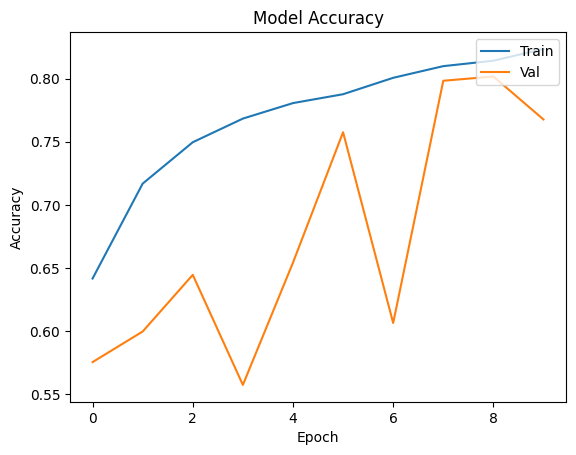

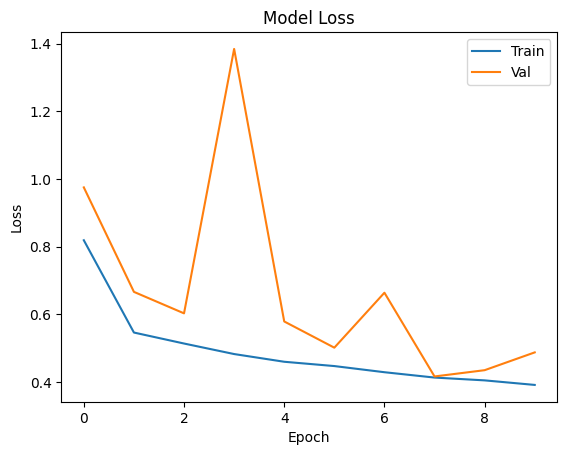

In [ ]:
# Display Model Performance during the training
plot_model_history(history4)

In [87]:
test_loss, test_acc, test_precision, test_recall = model4.evaluate(test_generator)

print('Accuracy:', test_acc)
print('Loss:', test_loss)
print('Precision:', test_precision)
print('Recall:', test_recall)

52/52 [==============================] - 23s 443ms/step - loss: 0.5019 - accuracy: 0.7659 - precision: 0.7134 - recall: 0.9578
Accuracy: 0.7659156322479248
Loss: 0.501886785030365
Precision: 0.7134346961975098
Recall: 0.9578047394752502


## - 5th CNN MODEL

- Improvements: harder Dropouts, more training epochs, l2_regularization

### Datasets:
- **Training set**: 30858 images 200x200 + Data Augmentation
- **Validation set**: 6612 images 200x200
- **Test set**: 6613 images 200x200
- **Batch size**: 128

### Model Architecture
The model consists of:
- **3 Conv2D layers** with ReLU activation, followed by **BatchNormalization** and **MaxPooling2D** layers.
- **Dropout layer** with a 30% rate after CNN layers.
- **2 Dense layers** with ReLU activation, and a **Dropout layer** with a 50% rate for regularization.
- Every layer above uses L2 Regularizer with a rate 0.01.
- The final **Output layer** uses a sigmoid activation.
### Model Compilation
The model is compiled using:
- **Optimizer**: Adam + Learning Rate Decay
- **Loss Function**: Binary Crossentropy
- **Metrics**: Accuracy, Precision, and Recall

### Training Configuration
The model is trained for **15 epochs**, with accuracy, precision, and recall monitored to evaluate the model's performance.


In [94]:
from tensorflow.keras import regularizers

# 5th CNN model with l2 regularizers
model5 = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3), kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),
    layers.Flatten(),
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])
model5.summary(print_fn=print)

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_130 (Conv2D)         (None, 198, 198, 32)      896       
                                                                 
 batch_normalization_130 (B  (None, 198, 198, 32)      128       
 atchNormalization)                                              
                                                                 
 max_pooling2d_40 (MaxPooli  (None, 99, 99, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_131 (Conv2D)         (None, 97, 97, 64)        18496     
                                                                 
 batch_normalization_131 (B  (None, 97, 97, 64)        256       
 atchNormalization)                                              
                                                     

In [ ]:
optimizer = Adam(learning_rate=lr_schedule)
# Compile the model
model5.compile(
    optimizer=optimizer,
    loss='binary_crossentropy',
    metrics=['accuracy', 'Precision', 'Recall']
)

In [96]:
# Train the model with 15 epochs
history5 = model5.fit(
        train_generator_c,
        steps_per_epoch=train_generator_c.samples // train_generator_c.batch_size,
        epochs=15,
        validation_data=val_generator_c,
        validation_steps=val_generator_c.samples // val_generator_c.batch_size,
)

Epoch 1/15
241/241 [==============================] - 350s 1s/step - loss: 1.9272 - accuracy: 0.6613 - precision: 0.6835 - recall: 0.7125 - val_loss: 1.3352 - val_accuracy: 0.5478 - val_precision: 0.5484 - val_recall: 0.9961
Epoch 2/15
241/241 [==============================] - 348s 1s/step - loss: 1.0744 - accuracy: 0.7031 - precision: 0.7253 - recall: 0.7382 - val_loss: 1.1133 - val_accuracy: 0.6311 - val_precision: 0.7060 - val_recall: 0.5613
Epoch 3/15
241/241 [==============================] - 353s 1s/step - loss: 0.8654 - accuracy: 0.7290 - precision: 0.7510 - recall: 0.7565 - val_loss: 0.9692 - val_accuracy: 0.6480 - val_precision: 0.8805 - val_recall: 0.4152
Epoch 4/15
241/241 [==============================] - 376s 2s/step - loss: 0.7762 - accuracy: 0.7426 - precision: 0.7661 - recall: 0.7637 - val_loss: 1.0666 - val_accuracy: 0.5637 - val_precision: 0.5577 - val_recall: 0.9980
Epoch 5/15
241/241 [==============================] - 375s 2s/step - loss: 0.7333 - accuracy: 0.7514

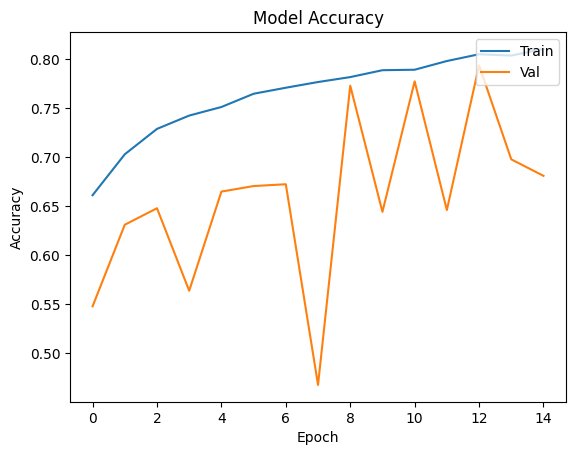

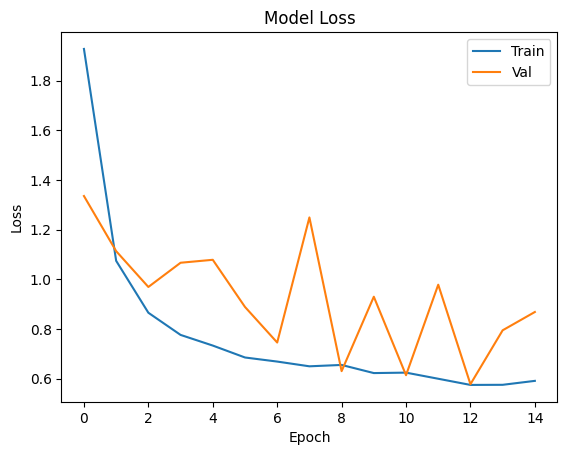

In [97]:
# Display Model Performance during the training
plot_model_history(history5)

In [98]:
a

52/52 [==============================] - 19s 360ms/step - loss: 0.8927 - accuracy: 0.6738 - precision: 0.6315 - recall: 0.9727
Accuracy: 0.6738243103027344
Loss: 0.8927263021469116
Precision: 0.6315129995346069
Recall: 0.9726971983909607


## - 6th CNN MODEL using ResNet50: 30000 30000

- Improvements: using ResNet50 with weights pre-trained on ImageNet

### Datasets:
- **Training set**: 42000 images 224x224 + Data Augmentation
- **Validation set**: 9000 images 224x224
- **Test set**: 9000 images 224x224
- **Batch size**: 64

### Model Architecture
The model consists of:
- **ResNet50 Base Model** pre-trained on ImageNet, without the top layers (feature extractor).
- **GlobalAveragePooling2D** to reduce the spatial dimensions and allow for a more compact representation.
- **1 Dense layers** with ReLU activation, and a **Dropout layer** with a 50% rate for regularization.
- The final **Output layer** uses a sigmoid activation.
### Model Compilation
The model is compiled using:
- **Optimizer**: Adam + Learning Rate Decay
- **Loss Function**: Binary Crossentropy
- **Metrics**: Accuracy, Precision, and Recall

### Training Configuration
The model is trained for **8 epochs**, with accuracy, precision, and recall monitored to evaluate the model's performance.


In [43]:
# Paths to datasets
train_dir = 'data/split/train'
val_dir = 'data/split/val'
test_dir = 'data/split/test'

# Normalize pixels values to [0,1] and use augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [69]:
# Load datasets, split into batches (batch size 64) and resize 224x224
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='binary'
)

Found 42000 images belonging to 2 classes.
Found 9000 images belonging to 2 classes.
Found 9000 images belonging to 2 classes.


In [47]:
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input,decode_predictions

In [71]:
# Load ResNet50 with weights pre-trained on ImageNet, excluding the top layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# Freeze the layers of the base model
base_model.trainable = False
# Model
model6 = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])
model6.summary(print_fn=print)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_5   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_8 (Dense)             (None, 256)               524544    
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_9 (Dense)             (None, 1)                 257       
                                                                 
Total params: 24,112,513
Trainable params: 524,801
Non-trainable params: 23,587,712
____________________________________

In [72]:
from tensorflow.keras.optimizers.legacy import Adam
# Learning Rate Delay
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=train_generator.samples // train_generator.batch_size,
    decay_rate=0.95
)
optimizer = Adam(learning_rate=lr_schedule)
# Compile the model
model6.compile(
    optimizer=optimizer,
    loss='binary_crossentropy',
    metrics=['accuracy', 'Precision', 'Recall']
)

In [79]:
# Train the model with 10 epochs
history6 = model6.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=8,
        validation_data=val_generator,
        validation_steps=val_generator.samples // val_generator.batch_size,
)

Epoch 1/8
656/656 [==============================] - 6278s 10s/step - loss: 0.6831 - accuracy: 0.5563 - precision: 0.5533 - recall: 0.5833 - val_loss: 0.6706 - val_accuracy: 0.5884 - val_precision: 0.5966 - val_recall: 0.5458
Epoch 2/8
656/656 [==============================] - 5802s 9s/step - loss: 0.6768 - accuracy: 0.5682 - precision: 0.5596 - recall: 0.6395 - val_loss: 0.6713 - val_accuracy: 0.5926 - val_precision: 0.5625 - val_recall: 0.8346
Epoch 3/8
656/656 [==============================] - 5833s 9s/step - loss: 0.6748 - accuracy: 0.5732 - precision: 0.5611 - recall: 0.6731 - val_loss: 0.6687 - val_accuracy: 0.6047 - val_precision: 0.5843 - val_recall: 0.7277
Epoch 4/8
656/656 [==============================] - 5851s 9s/step - loss: 0.6745 - accuracy: 0.5779 - precision: 0.5632 - recall: 0.6941 - val_loss: 0.6629 - val_accuracy: 0.6066 - val_precision: 0.5803 - val_recall: 0.7696
Epoch 5/8
656/656 [==============================] - 5864s 9s/step - loss: 0.6716 - accuracy: 0.582

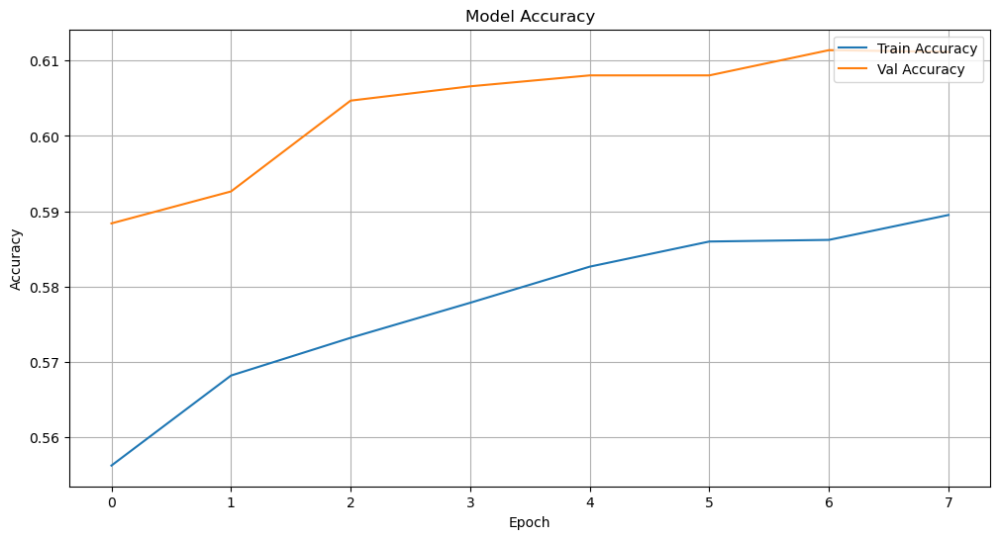

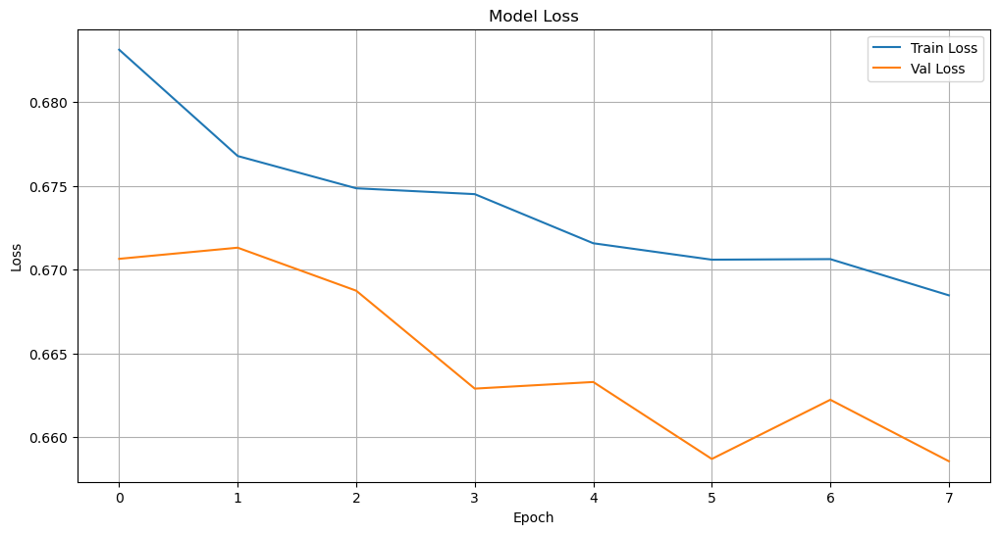

In [81]:
# Display Model Performance during the training
plot_model_history(history6)

In [83]:
test_loss, test_acc, test_precision, test_recall = model6.evaluate(test_generator)

print('Accuracy:', test_acc)
print('Loss:', test_loss)
print('Precision:', test_precision)
print('Recall:', test_recall)

141/141 [==============================] - 1184s 8s/step - loss: 0.6618 - accuracy: 0.6048 - precision: 0.5855 - recall: 0.7173
Accuracy: 0.6047777533531189
Loss: 0.6618116497993469
Precision: 0.5855250954627991
Recall: 0.7173333168029785
